In [8]:
import pandas as pd
import numpy as np
import pandas_profiling
import re

'camel_case_name'

In [38]:
dfraw = pd.read_csv('../data/ui-raw-single-header.csv')[:-1]

In [39]:
dfraw.tail()

,Week,nonSeasonallyAdjustedInitialClaims,initialClaimsSeasonalFactor,seasonallyAdjustedInitialClaims,seasonallyAdjustedInitialClaims4Week,nonSeasonallyAdjustedContinuingClaims,continuingClaimsSeasonalFactor,seasonallyAdjustedContinuingClaims,seasonallyAdjustedContinuingClaims4Week,nonSeasonallyAdjustedInsuredUnemploymentRate,seasonallyAdjustedInsuredUnemploymentRate,coveredEmployment
2827,2021-03-13,NaN,90.1,NaN,NaN,NaN,116.2,NaN,NaN,NaN,NaN,NaN
2828,2021-03-20,NaN,88.1,NaN,NaN,NaN,113.1,NaN,NaN,NaN,NaN,NaN
2829,2021-03-27,NaN,88.3,NaN,NaN,NaN,110.1,NaN,NaN,NaN,NaN,NaN
2830,2021-04-03,NaN,87.5,NaN,NaN,NaN,106.1,NaN,NaN,NaN,NaN,NaN
2831,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [40]:
dfraw.columns = [col.replace('nonSeasonallyAdjusted', '') for col in dfraw.columns]
dfraw.columns = [col.replace('seasonallyAdjusted', 'sa') for col in dfraw.columns]
dfraw.columns =[re.sub(r'(?<!^)(?=[A-Z])', '_', col).lower() for col in dfraw.columns]
dfraw.columns

Index(['week', 'initial_claims', 'initial_claims_seasonal_factor',
       'sa_initial_claims', 'sa_initial_claims4_week', 'continuing_claims',
       'continuing_claims_seasonal_factor', 'sa_continuing_claims',
       'sa_continuing_claims4_week', 'insured_unemployment_rate',
       'sa_insured_unemployment_rate', 'covered_employment'],
      dtype='object')

In [41]:
dfraw['week'] = pd.to_datetime(dfraw['week'], infer_datetime_format=True)

In [49]:
print(dfraw.shape)
date_limit = dfraw.loc[dfraw['initial_claims'].notna(), 'week'].max()
dffilt = dfraw.loc[dfraw['week']<=date_limit].copy()
print(dffilt.shape)

(2832, 12)
(2791, 12)


In [52]:
dffilt.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2791 entries, 0 to 2790
Data columns (total 12 columns):
 #   Column                             Non-Null Count  Dtype         
---  ------                             --------------  -----         
 0   week                               2791 non-null   datetime64[ns]
 1   initial_claims                     2791 non-null   object        
 2   initial_claims_seasonal_factor     2791 non-null   float64       
 3   sa_initial_claims                  2791 non-null   object        
 4   sa_initial_claims4_week            2791 non-null   object        
 5   continuing_claims                  2791 non-null   object        
 6   continuing_claims_seasonal_factor  2791 non-null   float64       
 7   sa_continuing_claims               2791 non-null   object        
 8   sa_continuing_claims4_week         2791 non-null   object        
 9   insured_unemployment_rate          2583 non-null   float64       
 10  sa_insured_unemployment_rate       2

In [61]:
cols = dffilt.select_dtypes(include='object').columns
dffilt[cols] = dffilt[cols].apply(lambda x: pd.to_numeric(x.str.replace(',',''), downcast='integer'))

In [62]:
print(dffilt.info())
dffilt.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2791 entries, 0 to 2790
Data columns (total 12 columns):
 #   Column                             Non-Null Count  Dtype         
---  ------                             --------------  -----         
 0   week                               2791 non-null   datetime64[ns]
 1   initial_claims                     2791 non-null   float32       
 2   initial_claims_seasonal_factor     2791 non-null   float64       
 3   sa_initial_claims                  2791 non-null   float32       
 4   sa_initial_claims4_week            2791 non-null   float32       
 5   continuing_claims                  2791 non-null   float32       
 6   continuing_claims_seasonal_factor  2791 non-null   float64       
 7   sa_continuing_claims               2791 non-null   float32       
 8   sa_continuing_claims4_week         2791 non-null   float32       
 9   insured_unemployment_rate          2583 non-null   float64       
 10  sa_insured_unemployment_rate       2

,week,initial_claims,initial_claims_seasonal_factor,sa_initial_claims,sa_initial_claims4_week,continuing_claims,continuing_claims_seasonal_factor,sa_continuing_claims,sa_continuing_claims4_week,insured_unemployment_rate,sa_insured_unemployment_rate,covered_employment
0,1967-01-07,346000.0,166.5,208000.0,0.0,1594000.0,140.6,1134000.0,0.0,NaN,NaN,NaN
1,1967-01-14,334000.0,161.5,207000.0,0.0,1563000.0,139.7,1119000.0,0.0,NaN,NaN,NaN
2,1967-01-21,277000.0,127.8,217000.0,0.0,1551000.0,138.6,1119000.0,0.0,NaN,NaN,NaN
3,1967-01-28,252000.0,123.8,204000.0,209000.0,1533000.0,139.0,1103000.0,1118750.0,NaN,NaN,NaN
4,1967-02-04,274000.0,127.1,216000.0,211000.0,1534000.0,135.6,1131000.0,1118000.0,NaN,NaN,NaN


## Pandas profiling

In [63]:
profile = pandas_profiling.ProfileReport(dffilt, title='Pandas Profiling Report of ui-claims', explorative=True)

In [65]:
profile.to_notebook_iframe()

In [69]:
dffilt.loc[dffilt['covered_employment'].isna(), 'week'].max()
first_date = dffilt.loc[dffilt['insured_unemployment_rate'].isna(), 'week'].max()

In [72]:
df = dffilt.loc[dffilt['week']>first_date].copy()

In [73]:
df.isna().sum()

week                                 0
initial_claims                       0
initial_claims_seasonal_factor       0
sa_initial_claims                    0
sa_initial_claims4_week              0
continuing_claims                    0
continuing_claims_seasonal_factor    0
sa_continuing_claims                 0
sa_continuing_claims4_week           0
insured_unemployment_rate            0
sa_insured_unemployment_rate         0
covered_employment                   0
dtype: int64

In [74]:
df.to_csv('../data/ui-claims.csv', index=False)

In [ ]:
## TO DO: Download as script and move to /bin

## Sample viz

<AxesSubplot:xlabel='week'>

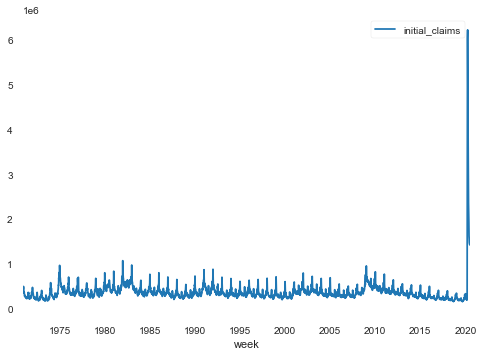

In [75]:
df.plot(x='week', y='initial_claims')